# Imports

In [1]:
import os
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import scipy
import seaborn as sns

/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_mtx from `anndat

In [2]:
from pathlib import Path
from matplotlib import pyplot as plt

# Parametrize some nonlinear positive functions

In [ ]:
def sample_cell_cycle_phase(n):
    # 60% G1, 25% S, 10% G2, 5% M
    phase_probs = [0.6, 0.25, 0.1, 0.05]
    phase_bins = np.cumsum([0] + phase_probs)

    raw = np.random.uniform(0, 1, n)
    theta = np.zeros(n)

    for i in range(4):
        mask = (raw >= phase_bins[i]) & (raw < phase_bins[i+1])
        # compress each phase to uneven angular width
        theta[mask] = (
            np.random.uniform(phase_bins[i], phase_bins[i+1], mask.sum())
        )

    return theta

In [3]:
from scipy.interpolate import PchipInterpolator

# Returns function mapping R^1 -> R^{size}, monotonic in every one of its output values 
def get_random_monotone_function(size=10):
    a = np.random.uniform(0.1, +.9, size)
    b = np.random.uniform(0.1, +.9, size)
    a, b = np.minimum(a, b), np.maximum(a, b)

    x_points = [-0.3, 0., 0.3, 0.7, 1., 1.3]
    y_points = [-a, a*0, a, b, b*0+1, (b*0+2)-b]

    f = PchipInterpolator(x_points, y_points)

    return f

In [245]:
def get_random_fourier_function(
    size=10,
    n_harmonics=5,
    amp_range=(0.05, 0.3),
    harmonic_decay=1.5,
    period=1.0,
):
    """
    Returns a function f: R -> R^{size} such that
    - domain of interest: x in [0, 1]
    - outputs in [0, 1]
    - smooth, periodic, Fourier-like
    - random phase shifts per gene per harmonic
    - amplitudes returned as (size,)
    """

    # Fundamental frequency shared across genes
    omega = 2 * np.pi / period

    # Base amplitude per gene (scalar)
    amplitudes = np.random.uniform(*amp_range, size)  # shape: (size,)

    # Harmonics: 1,2,...,n_harmonics
    harmonics = np.arange(1, n_harmonics + 1)  # shape: (n_harmonics,)

    # Random phases per gene per harmonic
    phases = np.random.uniform(0, 2 * np.pi, (size, n_harmonics))  # (size, n_harmonics)

    # Conservative baseline to keep outputs in [0, 1]
    max_dev = amplitudes * np.sum(1 / (harmonics ** harmonic_decay))
    baselines = np.random.uniform(max_dev, 1.0 - max_dev, size)

    def f(x):
        x = np.asarray(x)[..., None, None]  # (..., 1, 1)
        # expand amplitudes to match harmonics
        signal = np.sum(
            (amplitudes[:, None] / (harmonics[None, :] ** harmonic_decay)) *
            np.sin(harmonics * omega * x + phases),
            axis=-1
        )
        return baselines + signal

    return f, amplitudes

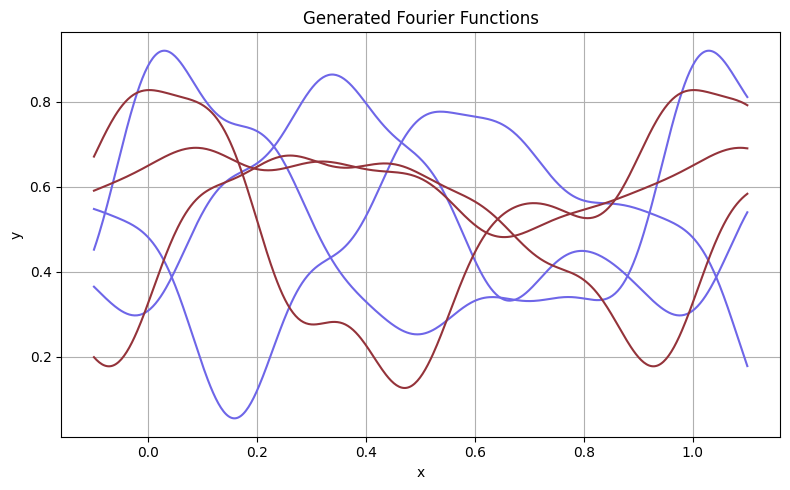

In [246]:
# NB: Generates 3 lines for each iteration (same colored lines) and plots them 
# Plot
plt.figure(figsize=(8, 5))

for i in range(2):
    f, amplitudes = get_random_fourier_function(3)
    x_vals = np.linspace(-0.1, 1.1, 500)
    y_vals = f(x_vals)
    
    plt.plot(x_vals, y_vals, color=np.random.rand(3,))
    plt.title('Generated Fourier Functions')
    plt.xlabel('x')
    plt.ylabel('y')

plt.grid(True)
plt.tight_layout()
plt.show()

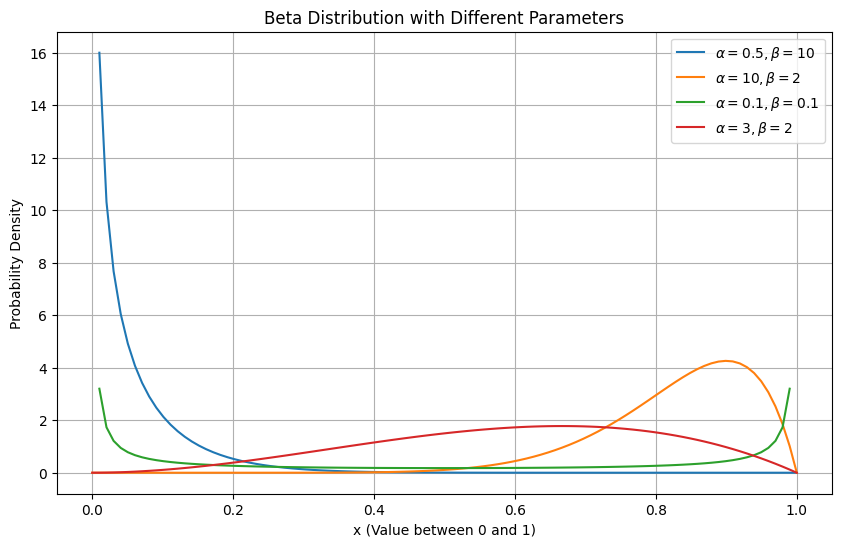

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import beta

# Define the alpha and beta parameters
alpha_values = [0.5,  10, 0.1, 3]
beta_values = [10, 2, 0.1, 2]
x = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(10, 6))

for a, b in zip(alpha_values, beta_values):
    # Calculate the probability density function (PDF) for the given alpha and beta
    pdf = beta.pdf(x, a, b)
    # Plot the PDF
    ax.plot(x, pdf, label=f'$\\alpha={a}, \\beta={b}$')

# Add labels and title
ax.set_xlabel('x (Value between 0 and 1)')
ax.set_ylabel('Probability Density')
ax.set_title('Beta Distribution with Different Parameters')

# Add a legend
ax.legend(loc='best')

# Add a grid for better readability
ax.grid(True)

# Show the plot
plt.show()

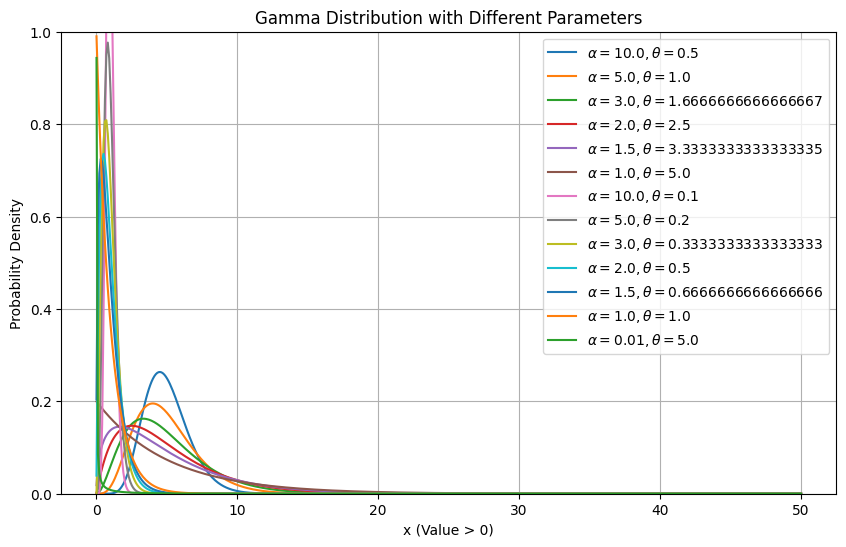

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gamma

# Define the alpha (shape) and scale (theta) parameters for the Gamma distribution
alpha_values = np.asarray([10, 5, 3, 2, 1.5, 1, 10, 5, 3, 2, 1.5, 1, 0.01])
mean_values = np.asarray([5, 5, 5, 5, 5, 5, 1, 1, 1, 1, 1, 1, 0.05])
scale_values = mean_values / alpha_values

x = np.linspace(0.01, 50, 500)

fig, ax = plt.subplots(figsize=(10, 6))

for a, s in zip(alpha_values, scale_values):
    # Calculate the probability density function (PDF) for the given alpha (shape) and scale
    pdf = gamma.pdf(x, a, scale=s)
    # Plot the PDF
    ax.plot(x, pdf, label=f'$\\alpha={a}, \\theta={s}$') # Using theta for scale parameter in label

# Add labels and title
ax.set_xlabel('x (Value > 0)')
ax.set_ylabel('Probability Density')
ax.set_title('Gamma Distribution with Different Parameters')
ax.set_ylim(0, 1)

# Add a legend
ax.legend(loc='best')

# Add a grid for better readability
ax.grid(True)

# Show the plot
plt.show()

In [13]:
def make_ground_truth(
    n_process = 30,
    n_pert = 100,
    n_cells_per_pert = 500,
    n_control_cells = 1000,
    max_process_per_pert = 5,
    n_genes = 1000,
    sinusodial_processes=None, 
):    
    # generate ground_truth matrix
    ## One hot encoding
    ground_truth = np.zeros((n_pert, n_process))
    for pert in range(n_pert):
        n_involved_processes = np.random.choice(np.arange(1, max_process_per_pert + 1).astype(int))
        involved_process = np.random.choice(np.arange(n_process), n_involved_processes)
        ground_truth[pert, involved_process] = 1
    
    # Make sure processes are distinguishable
    # NB: create a string representation of the one-hot encoding of peturbations affecting this process. Ensure that no two 
    #     processes have the same one-hot encoding of perturbations 
    assert len(set(["".join(x) for x in ground_truth.astype(str).T])) == n_process

    ## sort for easier downstream visualization
    ground_truth = ground_truth[np.lexsort(-ground_truth.T[::-1])]
    ## extend to number of cells
    ground_truth = np.broadcast_to(np.expand_dims(ground_truth, 1), (n_pert, n_cells_per_pert, n_process)).reshape(-1, n_process)

    # initialize additional rows (equal to number of control cells) set entirely to all 0s 
    ground_truth = np.pad(ground_truth, ((0, n_control_cells), (0, 0)), 'constant', constant_values=0)

    ## Make sure every ground-truth process in covered
    assert np.all(ground_truth.max(axis=0) == 1) # Ensures every process has a cell that it is being perturbing 

    # Generate latent space
    # --- Create a single global cyclic latent variable ---
    theta = sample_cell_cycle_phase(ground_truth.shape[0])
    
    inactive_latent = np.zeros_like(ground_truth, dtype=float)
    active_latent = np.zeros_like(ground_truth, dtype=float)
    
    for p in range(n_process):
        if sinusodial_processes is not None and p in sinusodial_processes:
            # GLOBAL shared phase for all cells
            active_latent[:, p] = theta
        else:
            # Monotone / non-cyclic processes remain perturbation-specific
            active_latent[:, p] = np.random.beta(10.0, 2.0, size=ground_truth.shape[0])
    
    # --- Construct z ---
    z = active_latent.copy()
    
    # Monotone processes are gated by perturbations
    monotone_processes = list(
        set(range(n_process)) - set(sinusodial_processes or [])
    )
    z[:, monotone_processes] *= ground_truth[:, monotone_processes]

    pert = np.concatenate([np.repeat(np.arange(n_pert) + 1, n_cells_per_pert), np.repeat(0, n_control_cells)])
    
    return ground_truth, z, pert

In [243]:
class SinusodialDecoder: 
    def __init__(self, x_dim, gene_indices, gene_max=(1, 10)):
        self.x_dim = x_dim
        self.gene_indices = gene_indices 
        self.x_n_nonzero = len(gene_indices) 

        # TODO - refactor activation function signatures so that they always return amplitudes as the second return value 
        self.activation_functions, self.amplitudes = get_random_fourier_function(size=self.x_n_nonzero) # TODO: changed from sinusodial function to fourier function 
        self.weights = np.random.uniform(*gene_max, size=self.x_n_nonzero)

        # TODO: consider removing this
        self.mapping = np.zeros((self.x_n_nonzero, x_dim))  # n_nonzero x x_dim
        self.mapping[np.arange(self.x_n_nonzero), self.gene_indices] = 1
        
        # print("self.gene_indices")
        # print(self.gene_indices) 
        # print("self.mapping")
        # print(self.mapping)
        # print("self.mapping[:,24]")
        # print(self.mapping[:,24])
        # print("self.mapping[:,23]")
        # print(self.mapping[:,23])
    
    def __call__(self, z):
        z  # n_sample
        print("SinusoidalDecoder: z.shape") 
        print(z.shape) 
        
        h = self.activation_functions(z) + self.amplitudes
        h = h * self.weights

        print("h")
        print(h)

        ret = np.zeros((z.shape[0], self.x_dim))
        for i, gene_idx in enumerate(self.gene_indices): 
            ret[:, gene_idx] = h[:, i]

        print("SinusoidalDecoder: ret.shape")
        print(ret.shape)     # A score for each gene for each of the cells? 
        
        return ret

In [196]:
sd = SinusodialDecoder(x_dim = 5, gene_indices = [0,1,2,3,4])
z = np.random.uniform(0,1,6000)
ret = sd(z)

SinusoidalDecoder: z.shape
(6000,)
h
[[11.38570938  1.8834035   2.62170378  6.44005069  4.92032892]
 [11.05629913  1.63276799  2.95623037  6.54080213  4.43852734]
 [11.47453307  2.47966429  2.88892623  6.27308281  5.72947892]
 ...
 [ 9.38495434  3.252099    5.83658918  6.22887828  5.42766379]
 [ 6.2076796   2.35594619  5.70231897  7.0776446   4.66027128]
 [ 8.96998186  1.27148434  5.36068893  6.8913762   3.26516969]]
SinusoidalDecoder: ret.shape
(6000, 5)


In [198]:
fn, amps = get_random_sinusodial_function(size=3)

In [199]:
print(z)

[0.52655621 0.49199839 0.59835745 ... 0.74611084 0.19147299 0.37420108]


In [200]:
fn(z)

array([[0.2299784 , 0.81854654, 0.16634598],
       [0.22366961, 0.81313253, 0.21126588],
       [0.32879561, 0.79485995, 0.11417367],
       ...,
       [0.68326492, 0.64132599, 0.20552289],
       [0.77037713, 0.52559433, 0.65859025],
       [0.39847611, 0.72242744, 0.41868332]])

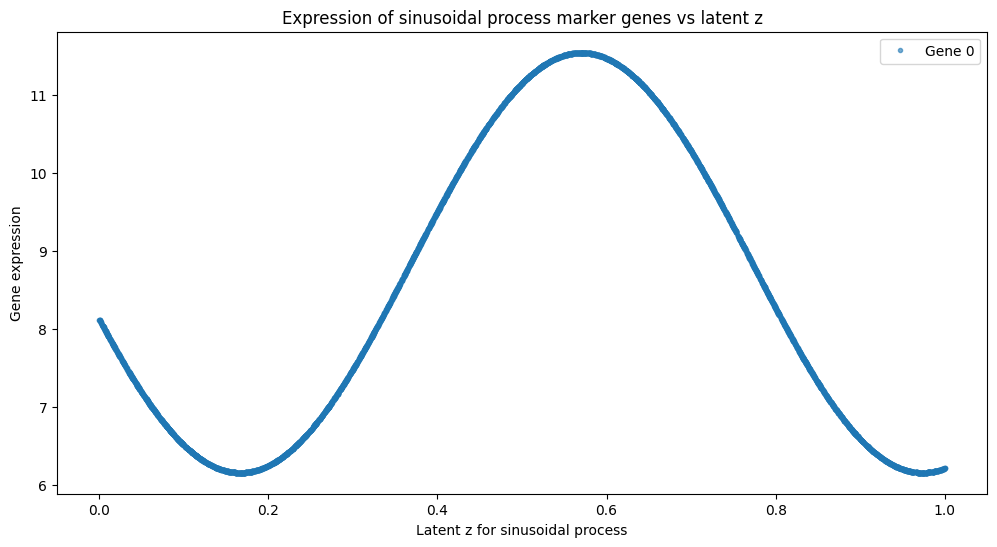

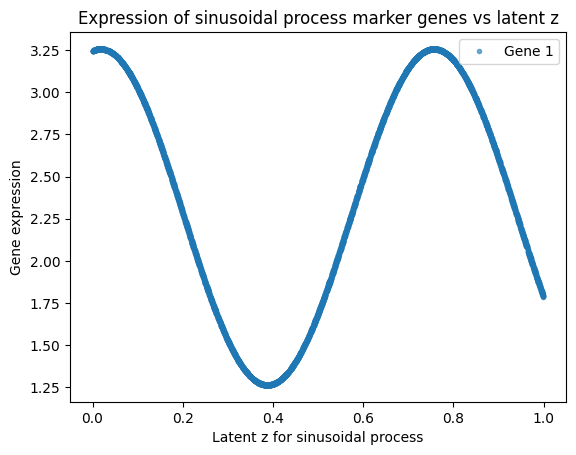

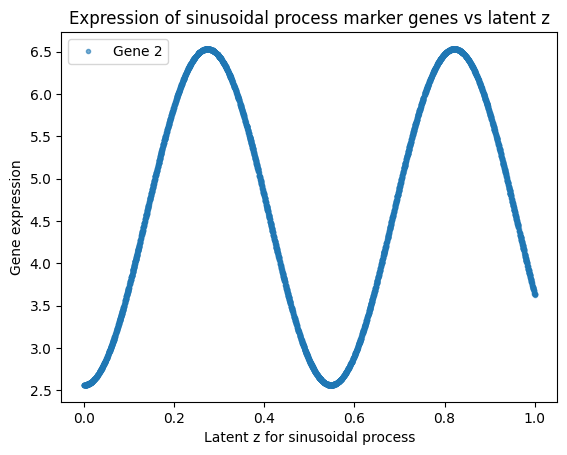

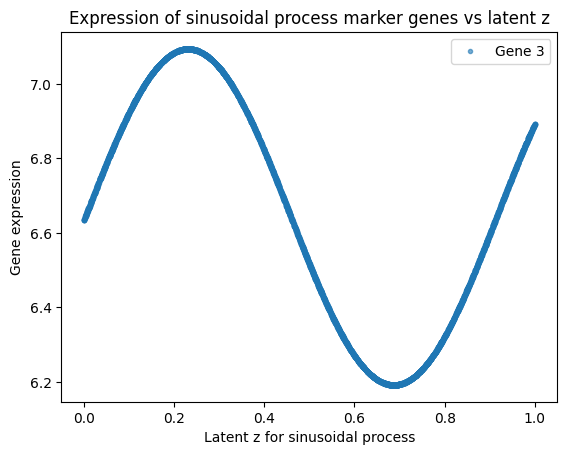

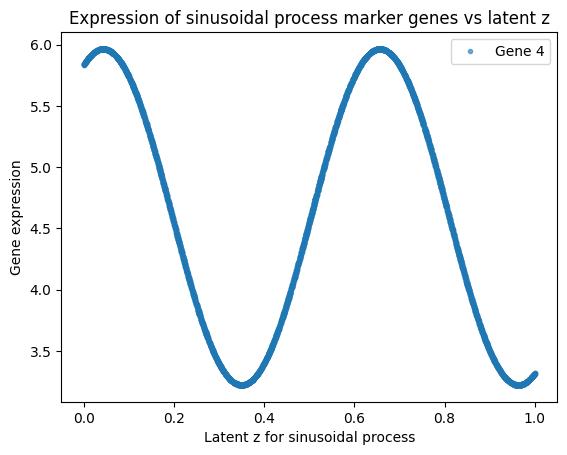

In [242]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
for i in range(5):

    fn, amps = get_random_sinusodial_function(size=1)
    
    plt.plot(z, ret[:,i], '.', label=f"Gene {i}", alpha=0.6)
    plt.xlabel("Latent z for sinusoidal process")
    plt.ylabel("Gene expression")
    plt.title("Expression of sinusoidal process marker genes vs latent z")
    plt.legend()
    plt.show()

In [238]:
class MonotoneDecoder:
    def __init__(self, x_dim, gene_indices, gene_max=(1, 10)):
        self.x_dim = x_dim
        self.gene_indices = gene_indices
        self.x_n_nonzero = len(gene_indices)

        self.activation_functions = get_random_monotone_function(size=self.x_n_nonzero)
        self.weights = np.random.uniform(*gene_max, size=self.x_n_nonzero)
        self.mapping = np.zeros((self.x_n_nonzero, x_dim))  # n_nonzero x x_dim
        self.mapping[np.arange(self.x_n_nonzero), self.gene_indices] = 1
    
    def __call__(self, z):
        z  # n_sample
        h = self.activation_functions(z).clip(min=0)  # n_sample x n_nonzero
        h = h * self.weights  # n_sample x n_nonzero
        x = h @ self.mapping  # n_nonzero x x_dim (TYPO?: should be n_sample x x_dim?) 
        return x
        
class AdditiveDecoders:
    # `x_n_nonzero` in the context of AdditiveDecoder is a range for the possible values 
    #  x_n_nonzero could take on in the context of a single MonotoneDecoder... 
    def __init__(self, z_dim, x_dim, decoders, x_n_nonzero=(5, 10), gene_max=(1, 10), gamma_shape=(1, 5), 
                 noise_gamma_scale=(1, 5), noise_gamma_shape=(0.01, 0.05), agg='LSE', **kwargs):

        self.z_dim = z_dim
        self.x_dim = x_dim
        self.x_n_nonzero = x_n_nonzero
        self.gene_max = gene_max
        self.gamma_shape = gamma_shape
        self.noise_gamma_scale = noise_gamma_scale
        self.noise_gamma_shape = noise_gamma_shape
        self.agg = agg
        
        self.decoders = decoders 

        # 1. Take the max value of every dimensions for every sample in every decoder
        # 2. Then, subtract this quantity from the noise_dims 
        # Shape: Should be 1 x (x_dim)
        self.noise_dims = 1 - np.max([d.mapping.max(axis=0).flatten() for d in self.decoders], axis=0, keepdims=True)
            
    def split_latent(self, z):
        
        return np.array_split(z, self.z_dim, axis=-1)

    def _add_noise(self, x):
        x = x.copy()
        
        # Create noise from same distribution of non-noise genes
        non_noise_genes = np.argwhere(self.noise_dims.flatten() == 0).flatten()
        noise_genes = np.argwhere(self.noise_dims.flatten() == 1).flatten()
        
        non_noise_samples = x[:, non_noise_genes]
        
        # Randomly shuffle each gene independently
        shuffled_noise = np.empty((x.shape[0], len(noise_genes)))
        
        for i in range(len(noise_genes)):
            gene_values = non_noise_samples[:, i % non_noise_samples.shape[1]].flatten().copy()
            np.random.shuffle(gene_values)
            shuffled_noise[:, i] = gene_values
        
        # Add noise only to noise genes
        x[:, noise_genes] += shuffled_noise
        return x
    
    # Take latents - pass to additive decoders, which then compute parameters of the 
    # Gamma prior. We sample from this gamma prior to generate the final parameters of a 
    # Poisson distribution, which we sample from for every gene in every sample to generate 
    # (simulated?) data 
    def __call__(self, z):
        z_components = self.split_latent(z)
        
        outputs = []
        for z_comp, decoder in zip(z_components, self.decoders):
            decoded_chunk = decoder(z_comp.flatten()) # NB: pass in perturbations for each processor into 
                                                      # single MonotoneDecoder 
            
            outputs.append(decoded_chunk) # NB: n_samples x x_dim 

        """
        print("outputs[1][:,23]")
        print(outputs[1][:,23])
        print("outputs[1][:,24]")
        print(outputs[1][:,24])
        """
        
        outputs = np.stack(outputs, axis=-1) # NB: n_samples x x_dim x n_decoders

        marker_genes = np.argwhere(self.noise_dims.flatten() == 0).flatten() 
        noise_genes = np.argwhere(self.noise_dims.flatten() == 1).flatten()  # TODO: refactor noise_genes to make it a strict complement of marker_genes 
        
        mean_signal = np.sum(outputs, axis=-1) 

        result = mean_signal 
        
        # result = np.zeros_like(mean_signal)

        """
        print("marker_genes")
        print(marker_genes)
        """

        # ----- Marker genes: keep trends visible -----
        if len(marker_genes) > 0:
            # Use gamma with small variance: shape >> scale to preserve trend
            gamma_shape_marker = np.random.uniform(5, 10, size=(len(marker_genes), 1))
            gamma_scale_marker = mean_signal[:, marker_genes] / gamma_shape_marker.T
            result[:, marker_genes] = np.random.gamma(gamma_shape_marker.T, gamma_scale_marker)

            print("AdditiveDecoders: __call__ : MARKER_GENES:")
            print("gamma_shape_marker.mean()")
            print(gamma_shape_marker.mean())
            print("gamma_scale_marker.mean()")
            print(gamma_scale_marker.mean())
    
        # ----- Noise genes -----
        if len(noise_genes) > 0:
            gamma_shape_noise = np.random.uniform(*self.gamma_shape, size=(len(noise_genes), 1))
            gamma_scale_noise = mean_signal[:, noise_genes] / gamma_shape_noise.T
            result[:, noise_genes] = np.random.gamma(gamma_shape_noise.T, gamma_scale_noise)

            print("AdditiveDecoders: __call__ : NOISE_GENES:")
            print("gamma_shape_noise.mean()")
            print(gamma_shape_noise.mean())
            print("gamma_scale_noise.mean()")
            print(gamma_scale_noise.mean())
    
        # Optional: Add small extra noise for realism
        noise_extra = np.random.gamma(
            np.random.uniform(*self.noise_gamma_shape, size=result.shape),
            np.random.uniform(*self.noise_gamma_scale, size=result.shape)
        )
        result += noise_extra


        #### !!! CONSTRUCTION !!!
        """
        outputs_sum = np.sum(outputs, axis=-1)
        print("outputs_sum[:,23]")
        print(outputs_sum[:,23])
        print("outputs_sum[:,24]")
        print(outputs_sum[:,24])

        print("result[:,23]") 
        print(result[:,23]) 
        print("result[:,24]") 
        print(result[:,24]) 
        """
        
        #### !!! CONSTRUCTION !!!
        """
        """
        
        # Median UMI count across samples 
        print("Median library size: ", np.median(result.sum(axis=1, keepdims=True)))
        
        # result = result / np.median(result.sum(axis=1, keepdims=True))
        result = np.random.poisson(lam=result)
        
        """
        print("AFTER_POISSON_SAMPLING")
        print("result[:,23]") 
        print(result[:,23]) 
        print("result[:,24]") 
        print(result[:,24]) 
        """
        
        return result

In [239]:
def generate_simulated_adata_with_cc(
    seed=0,
    n_process=20,
    n_genes=1000,
    process_effect_size=(2, 100),
    gene_max=(1, 100),
    gamma_shape=(1, 5),
    noise_gamma_scale=(0.1, 10),
    noise_gamma_shape=(0.05, 0.1),
    n_pert=50,
    n_cells_per_pert=100,
    n_control_cells=1000,
    max_process_per_pert=4
):
    np.random.seed(seed)

    
    n_monotone_processes = n_process - 1 
    n_sinusodial_processes = 1 
    assert(n_monotone_processes + n_sinusodial_processes == n_process)
    # INVARIANT: ordering of processes is as follows: 
    # - monotone processes 
    # - sinusodial processes 

    # NB: z is n_pert x n_process
    ground_truth, z, pert = make_ground_truth(
        n_process=n_process,
        n_pert=n_pert, 
        n_cells_per_pert=n_cells_per_pert,
        n_control_cells=n_control_cells,
        max_process_per_pert=max_process_per_pert,
        n_genes=n_genes,
        sinusodial_processes = list(range(n_monotone_processes, n_monotone_processes + n_sinusodial_processes)), 
    )

    # --- Decide marker genes for each process ---
    all_genes = np.arange(n_genes)
    np.random.shuffle(all_genes)
    # Assign disjoint slices of genes to each process
    gene_indices_per_process = []
    start = 0

    
    # TODO: Uncomment this out again after debugging 

    for i in range(n_process):
        n_genes_for_process = np.random.randint(process_effect_size[0], process_effect_size[1]+1)
        end = min(start + n_genes_for_process, n_genes)
        gene_indices = all_genes[start:end] # TODO: HARDCODE VALUES HERE, AND THEN SEE WHAT IS GOING ON WITH THE 
                                            # SINUSOIDAL DECODER ABOVE!!!!
        gene_indices_per_process.append(gene_indices)
        start = end


    """
    # TODO - remove for debugging purposes only
    gene_indices_per_process.append(np.array([1,2,3,5,6,7,8,9,10]))
    gene_indices_per_process.append(np.array([11,12,13,14,15,16,17,18,19,20,21,22,23,24,25]))
    """

    decoders = [
        MonotoneDecoder(x_dim=n_genes, 
                        gene_indices=gene_indices_per_process[i], 
                        gene_max=gene_max)
        for i in range(n_monotone_processes)
    ] + [
        SinusodialDecoder(x_dim=n_genes, 
                          gene_indices=gene_indices_per_process[i], 
                          gene_max=gene_max)
        for i in range (n_monotone_processes, n_monotone_processes + n_sinusodial_processes)
    ]

    decoder = AdditiveDecoders(
        z_dim=n_process,
        x_dim=n_genes,
        decoders=decoders,
        x_n_nonzero=process_effect_size, # NB: `process_effect_size` is range of possible genes a process can affect
        gene_max=gene_max,
        gamma_shape=gamma_shape,
        noise_gamma_scale=noise_gamma_scale,
        noise_gamma_shape=noise_gamma_shape,
    )
    observations = decoder(z)

    print("observations[:,24]")
    print(observations[:,24])
    
    adata = ad.AnnData(observations)

    print("immediately after adata instantiation: adata.var_names.get_loc('24')") 
    print(adata.var_names.get_loc("24"))
    print("immediately after adata instantiation: adata.X[:,idx_24]") 
    idx_24 = adata.var_names.get_loc("24") 
    print(adata.X[:,idx_24]) 

    adata.obs["pert"] = pert
    adata.obs["pert"] = pd.Categorical(adata.obs["pert"])
    adata.obsm["ground_truth_identity"] = ground_truth
    adata.obsm["ground_truth_z"] = z
    adata.obs["perfect_order"] = np.arange(adata.n_obs)

    adata.varm["ground_truth_effect"] = np.stack(
        [d.mapping.sum(axis=0).flatten() for d in decoder.decoders], axis=1
    ) # returns matrix n_x_nonzero x decoders 
    
    # Sort genes by their ground truth effect for consistent ordering
    adata = adata[:, np.lexsort(-adata.varm["ground_truth_effect"].T[::-1])].copy()
    # adata.varm["ground_truth_effect"].T - n_decoders x n_x_nonzero 
    # -adata.varm["ground_truth_effect"].T[::-1]) - reverses the order of the decoders 
    # sort n_x_nonzero based on decoder impact - with n_x_nonzero (genes?) affected by the last 
    # decoder the most being brought to the front of the lexical ordering, and the (gene?) least affected 
    # by all the decoders being placed al the end of the lexical ordering 

    print("adata.X[:,24]")
    print(adata.X[:,24])
    print("adata.var_names[24]")
    print(adata.var_names[24])
    
    adata.var["perfect_order"] = np.arange(adata.n_vars) # NB: generate 0-based indices for all of the cells 
    affected_genes = {str(i): list(map(str, g.tolist())) for i, g in enumerate(gene_indices_per_process)}

    adata.uns["affected_genes"] = affected_genes

    adata.layers["counts"] = adata.X.copy()
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)

    print("immediately before returning adata: adata.var_names.get_loc('24')") 
    print(adata.var_names.get_loc("24"))
    print("immediately before returning adata: adata.X[:,idx_24]") 
    idx_24 = adata.var_names.get_loc("24") 
    print(adata.X[:,idx_24]) 

    return adata

In [247]:
simulated_data_cc_2 = generate_simulated_adata_with_cc(n_process=2)

SinusoidalDecoder: z.shape
(6000,)
h
[[60.13609178 65.33728582 17.27172284 ...  1.53749818 43.50626911
  11.50266831]
 [45.97564408 52.1790109  15.27418075 ...  1.56160137 64.02253817
  19.54041568]
 [95.66931778 44.55494855  8.30511452 ...  1.59618849 66.05043834
  25.03809944]
 ...
 [59.60748901 53.4901895  14.63830112 ...  1.68791633 45.14967005
  21.84378226]
 [51.3455764  57.38685393 18.92908718 ...  1.52156504 47.92761874
  19.01213214]
 [60.6873523  57.47698828 16.6920651  ...  1.58153604 39.73599142
  17.49366824]]
SinusoidalDecoder: ret.shape
(6000, 1000)
AdditiveDecoders: __call__ : MARKER_GENES:
gamma_shape_marker.mean()
7.484467502955208
gamma_scale_marker.mean()
4.010736686771898
AdditiveDecoders: __call__ : NOISE_GENES:
gamma_shape_noise.mean()
3.029667856396426
gamma_scale_noise.mean()
0.0
Median library size:  6246.95592720933
observations[:,24]
[1 0 0 ... 0 0 0]
immediately after adata instantiation: adata.var_names.get_loc('24')
24
immediately after adata instantiatio

In [34]:
simulated_data_cc_2.X[:,22]

array([6.1752653, 7.0782094, 5.894568 , ..., 6.552443 , 5.877411 ,
       5.878891 ], dtype=float32)

In [40]:
simulated_data_cc_2.layers['counts'][:,22]

array([ 823, 1819,  186, ...,  560,  520,  431])

In [ ]:
simulated_data_cc_20 = generate_simulated_adata_with_cc(n_process=20, n_genes=2000) 

In [222]:
# Randomly shuffle rows to ensure structures originating from the nuances of how the data was 
# created does not bias training (?) 
simulated_data_cc_2 = simulated_data_cc_2[np.random.permutation(simulated_data_cc_2.obs.index), np.random.permutation(simulated_data_cc_2.var.index)].copy()
# simulated_data_cc_20 = simulated_data_cc_20[np.random.permutation(simulated_data_cc_20.obs.index), np.random.permutation(simulated_data_cc_20.var.index)].copy()

In [47]:
save_path = "/Users/jeromecho/onedrive/Thesis/thesis/data/synthetic/drvi_repro_cc_ext" 

In [251]:
simulated_data_cc_2.write_h5ad(os.path.join(save_path, "simulated_data_cc_2_02_10_random_with_poisson_fourier.h5ad"))

In [94]:
# simulated_data_cc_20.write_h5ad(os.path.join(save_path, "simulated_data_cc_20.h5ad"))

In [19]:
# Loading already generated simulated data...
simulated_data_cc_2  = sc.read_h5ad(os.path.join(save_path, "simulated_data_cc_2.h5ad"))

In [20]:
simulated_data_cc_20  = sc.read_h5ad(os.path.join(save_path, "simulated_data_cc_20.h5ad"))

#### Sanity Checking Sinusodial Signals in Synthetic Data

In [248]:
sinusodial_process_idx = len(simulated_data_cc_2.uns['affected_genes']) - 1 
marker_genes = simulated_data_cc_2.uns["affected_genes"][str(sinusodial_process_idx)]
marker_genes = list(map(int, marker_genes))
print(f"Marker genes for sinusoidal process: {marker_genes}")

Marker genes for sinusoidal process: [299, 217, 447, 458, 76, 78, 173, 597, 698, 694, 950, 742, 803, 755, 676, 36, 145, 871, 221, 31, 805, 746, 357, 712, 526, 994, 420, 534, 410, 286, 539, 101, 553, 322, 783, 1, 16, 811, 632, 710, 659, 822, 433, 771, 713, 690, 861, 167, 715, 416, 379, 405, 455, 49, 484, 265, 814, 640, 603, 851, 623, 154, 855, 674, 276, 657, 967, 739, 617, 304, 692, 815, 390, 711, 883, 774, 661, 309, 987, 51, 412]


In [249]:
simulated_data_cc_2.layers["counts"][:,24]

array([66, 43, 76, ...,  0,  0,  1])

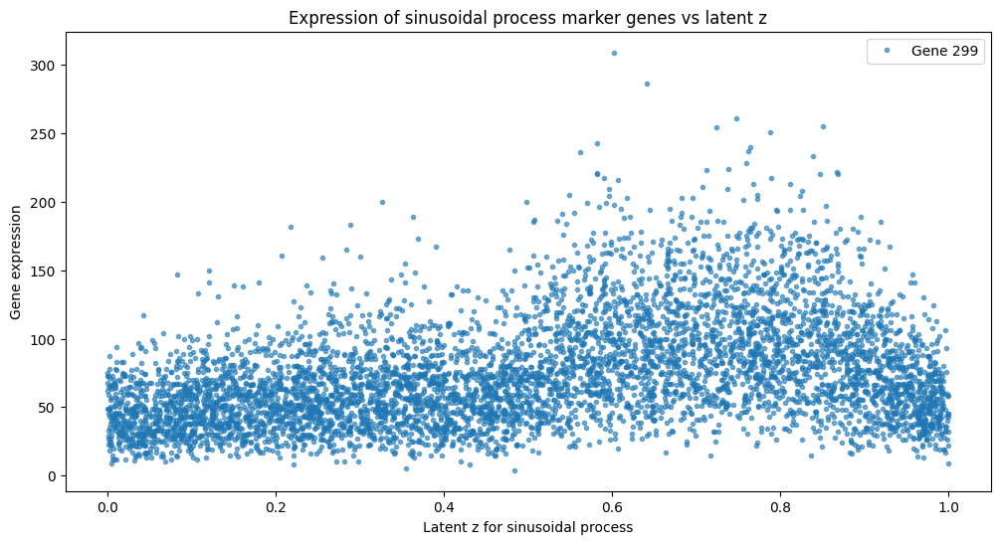

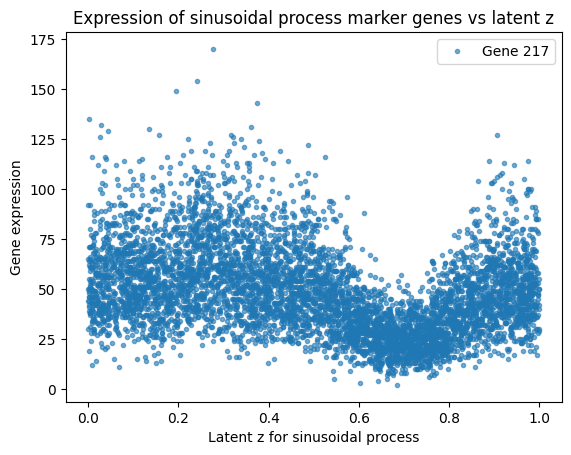

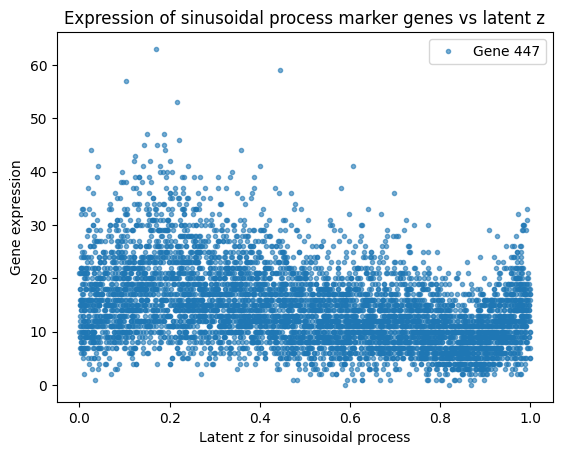

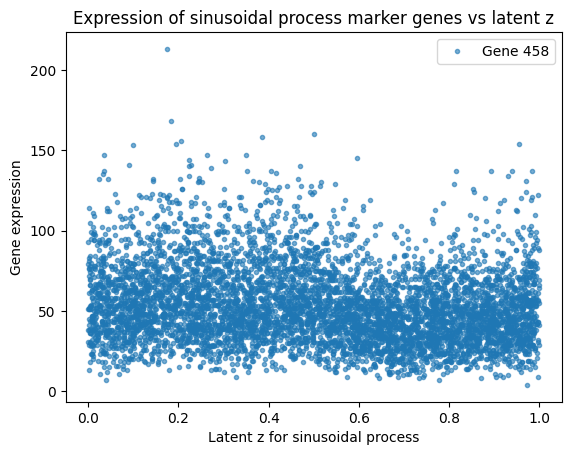

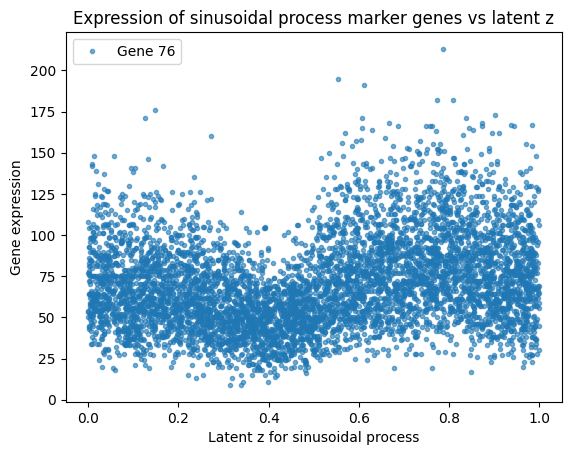

...

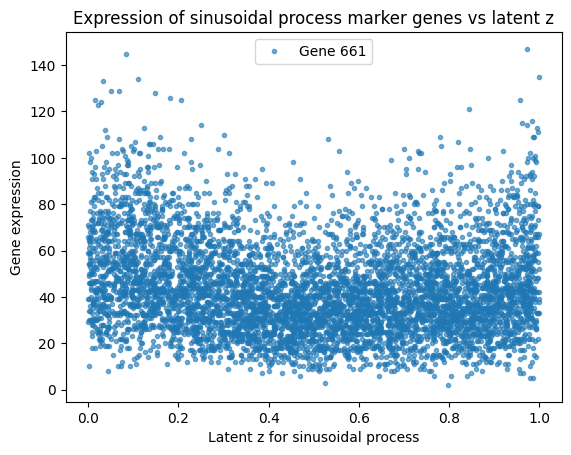

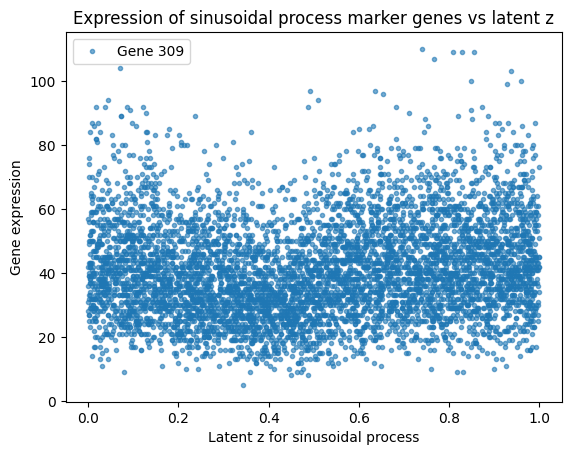

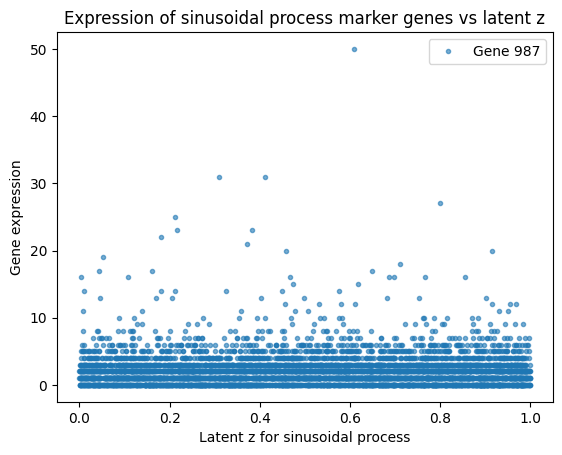

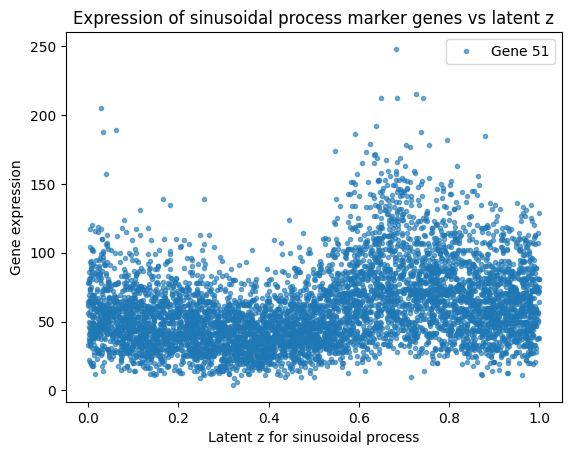

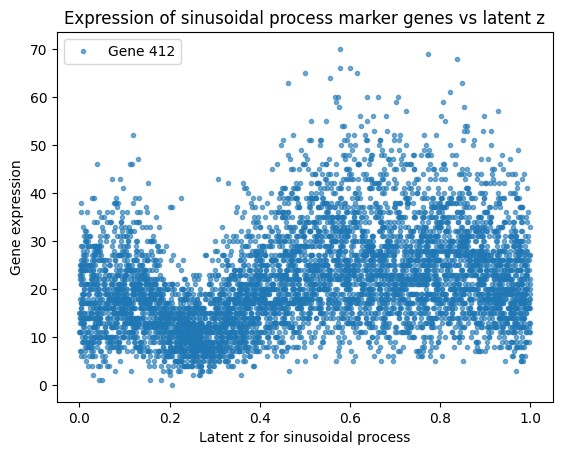

In [250]:
import matplotlib.pyplot as plt

marker_gene_indices = [simulated_data_cc_2.var_names.get_loc(str(gene)) for gene in marker_genes]

z_sin = simulated_data_cc_2.obsm["ground_truth_z"][:, sinusodial_process_idx] # latent values for sinusoidal process
counts_sin = simulated_data_cc_2.layers["counts"][:, marker_gene_indices]

plt.figure(figsize=(12,6))
for i, gene_idx in enumerate(marker_genes):

    plt.plot(z_sin, counts_sin[:, i], '.', label=f"Gene {gene_idx}", alpha=0.6)
    plt.xlabel("Latent z for sinusoidal process")
    plt.ylabel("Gene expression")
    plt.title("Expression of sinusoidal process marker genes vs latent z")
    plt.legend()
    plt.show()

#### Sanity Checking Monotonic Signals in Synthetic Data

In [97]:
monotonic_process_idx = len(simulated_data_cc_2.uns['affected_genes']) - 2 # arbitrarily chosen 
marker_genes = simulated_data_cc_2.uns["affected_genes"][str(monotonic_process_idx)]
marker_genes = list(map(int, marker_genes))
print(f"Marker genes for Monotonic process: {marker_genes}")

Marker genes for Monotonic process: [287, 828, 172, 290, 906, 456, 765, 973, 380, 854, 422, 358, 528, 434, 489, 608, 349, 831, 62, 689, 647, 536, 153, 541, 432, 809, 916, 264, 157, 598, 296, 272, 818, 966, 205, 610, 135, 921, 74, 753, 461, 586, 790, 194, 155, 303, 631, 6, 638, 850, 42, 127, 970, 546, 469, 670, 104, 962, 147, 550, 359, 307, 18, 500, 28, 95, 88, 212, 0, 124, 604, 857, 140, 738, 614, 97, 773, 591, 894, 611, 258, 889, 143, 644, 561, 862, 198, 201, 284]


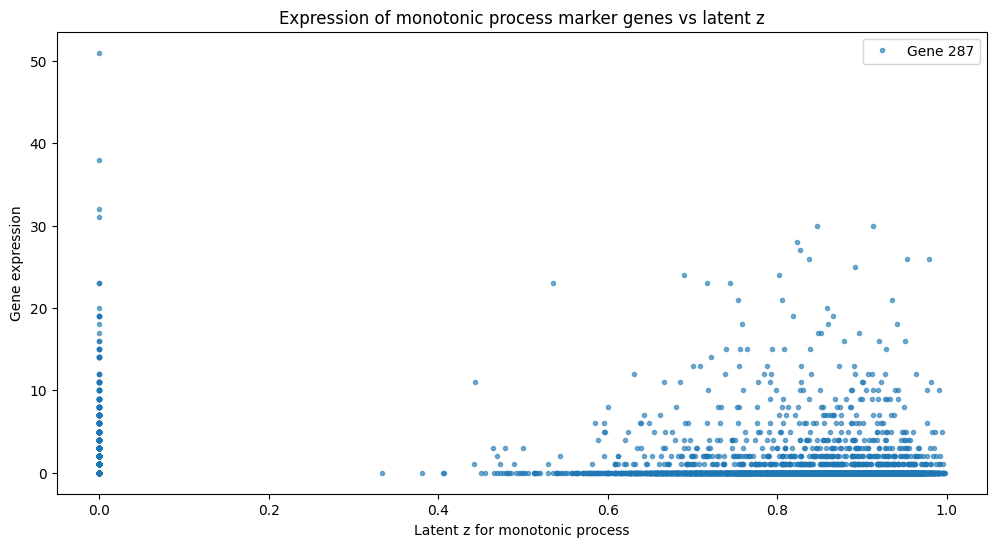

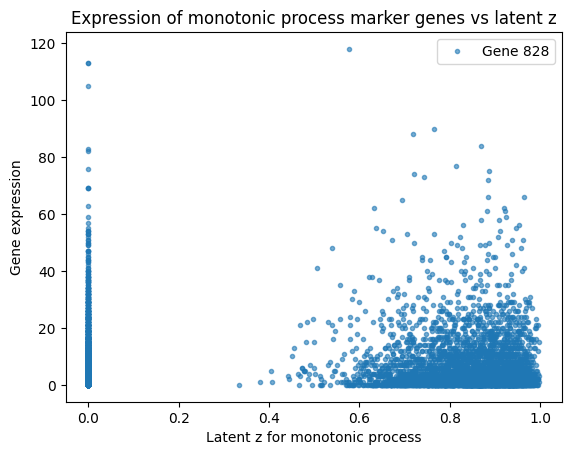

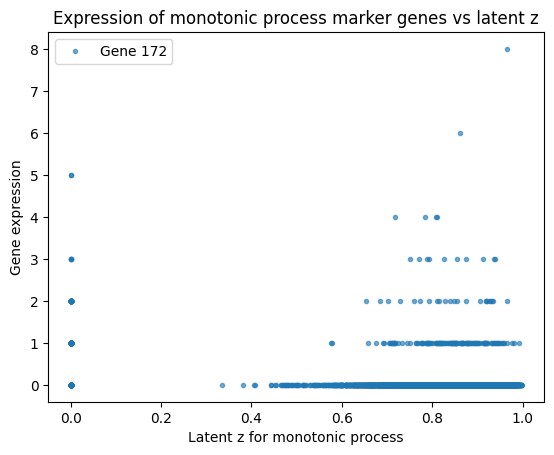

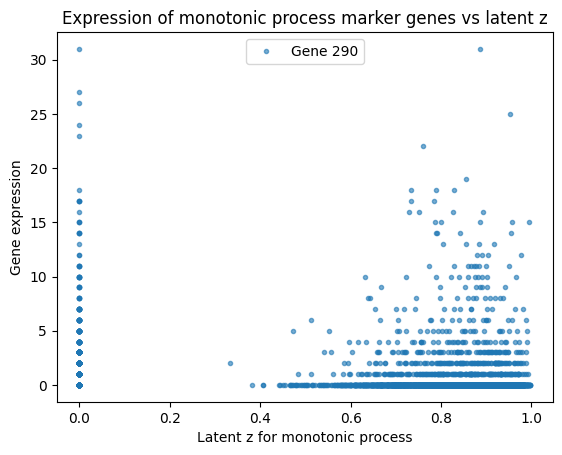

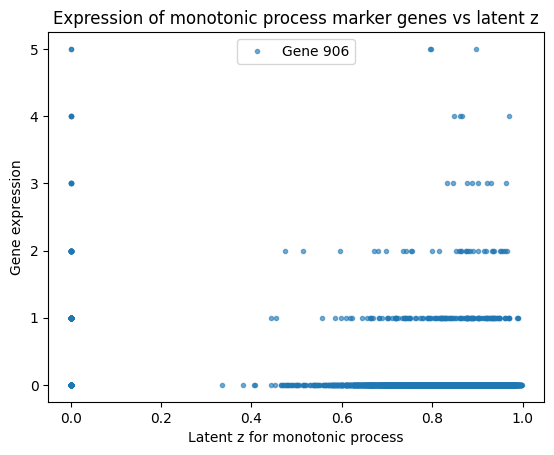

...

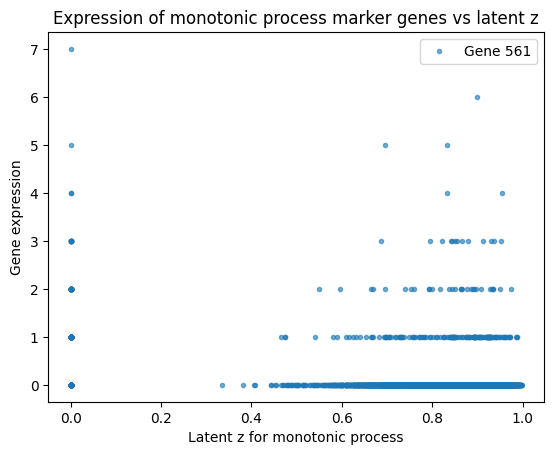

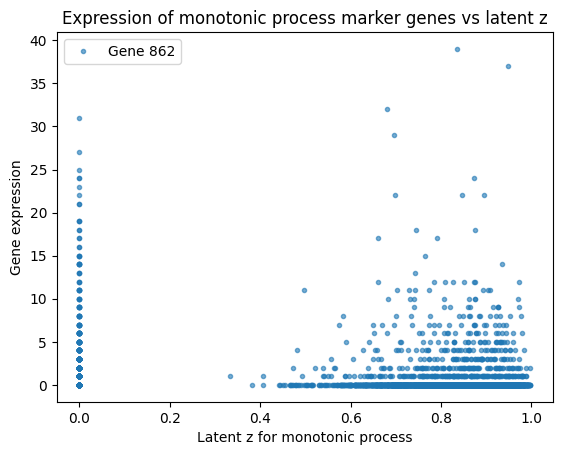

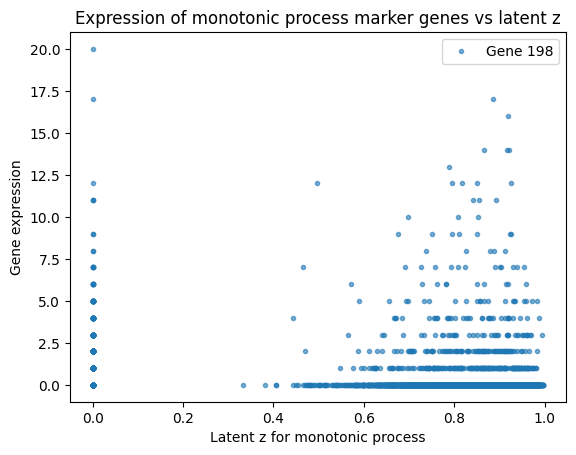

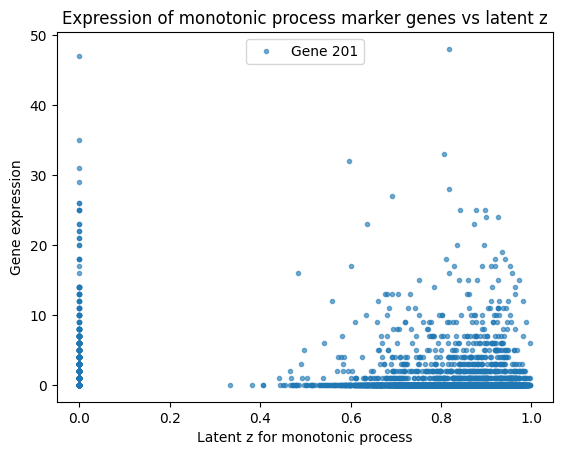

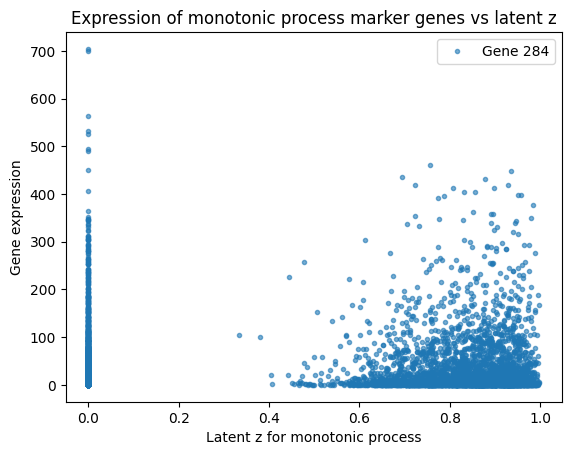

In [98]:
import matplotlib.pyplot as plt

z_sin = simulated_data_cc_2.obsm["ground_truth_z"][:, monotonic_process_idx] # latent values for sinusoidal process
counts_sin = simulated_data_cc_2.layers["counts"][:, marker_genes]

plt.figure(figsize=(12,6))
for i, gene_idx in enumerate(marker_genes):
    plt.plot(z_sin, counts_sin[:, i], '.', label=f"Gene {gene_idx}", alpha=0.6)
    plt.xlabel("Latent z for monotonic process")
    plt.ylabel("Gene expression")
    plt.title("Expression of monotonic process marker genes vs latent z")
    plt.legend()
    plt.show()

#### Heatmaps

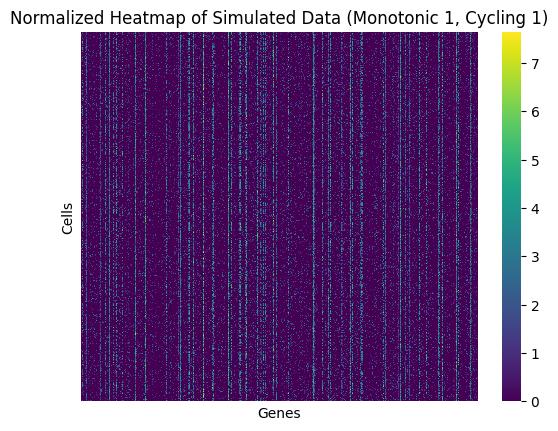

In [99]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(
    simulated_data_cc_2.X,
    cmap="viridis",
    xticklabels=False,
    yticklabels=False,
)

plt.title("Normalized Heatmap of Simulated Data (Monotonic 1, Cycling 1)") 
plt.xlabel("Genes")
plt.ylabel("Cells")
plt.show()

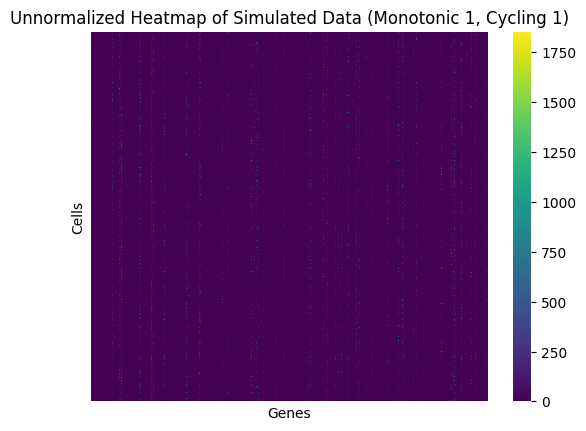

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(
    simulated_data_cc_2.layers["counts"],
    cmap="viridis",
    xticklabels=False,
    yticklabels=False,
)

plt.title("Unnormalized Heatmap of Simulated Data (Monotonic 1, Cycling 1)") 
plt.xlabel("Genes")
plt.ylabel("Cells")
plt.show()

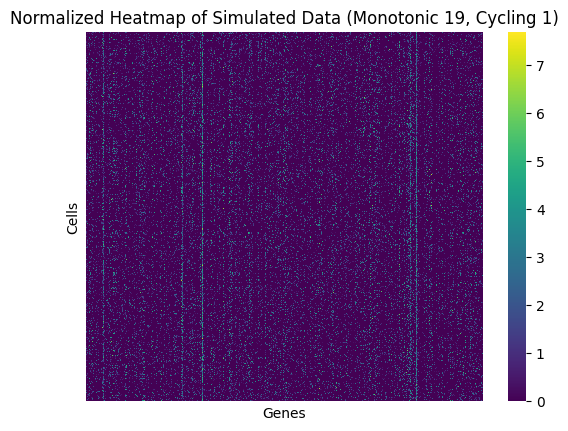

In [101]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(
    simulated_data_cc_20.X,
    cmap="viridis",
    xticklabels=False,
    yticklabels=False,
)

plt.title("Normalized Heatmap of Simulated Data (Monotonic 19, Cycling 1)") 
plt.xlabel("Genes")
plt.ylabel("Cells")
plt.show()


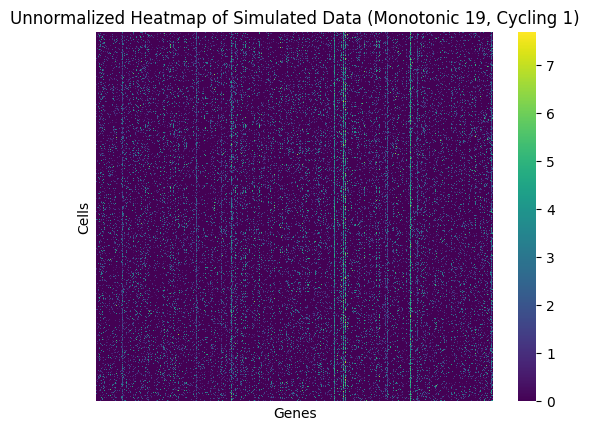

In [102]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(
    simulated_data_cc_20.X,
    cmap="viridis",
    xticklabels=False,
    yticklabels=False,
)

plt.title("Unnormalized Heatmap of Simulated Data (Monotonic 19, Cycling 1)") 
plt.xlabel("Genes")
plt.ylabel("Cells")
plt.show()


In [103]:
simulated_data_cc_2.obsm['ground_truth_identity']

array([[0., 1.],
       [0., 0.],
       [1., 1.],
       ...,
       [0., 1.],
       [1., 0.],
       [1., 0.]])

In [109]:
simulated_data_cc_2.varm['ground_truth_effect'].shape

(1000, 2)

In [107]:
simulated_data_cc_2.var.iloc

In [26]:
simulated_datasets = {
    'simulated_data_cc_2': simulated_data_cc_2,
    'simulated_data_cc_20': simulated_data_cc_20,
}

In [31]:
simulated_data_cc_2.var

,perfect_order
26,191
661,136
419,521
499,588
427,527
...,...
613,682
916,83
986,987
64,222


In [37]:
save_path = Path(save_path)

In [38]:
adata_write = simulated_data_cc_2[np.random.permutation(simulated_data_cc_2.obs.index), np.random.permutation(simulated_data_cc_2.var.index)].copy()
adata_write.write_h5ad(save_path / "{simulated_data_cc_2_02_07.h5ad")

simulated_data_cc_2


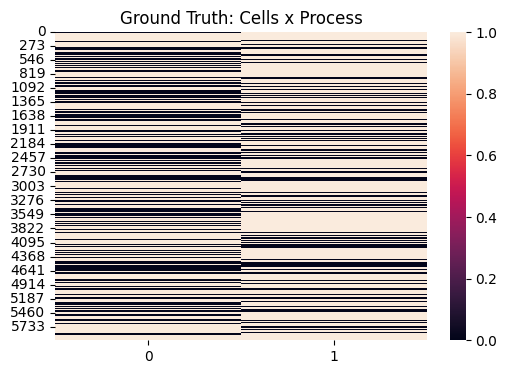

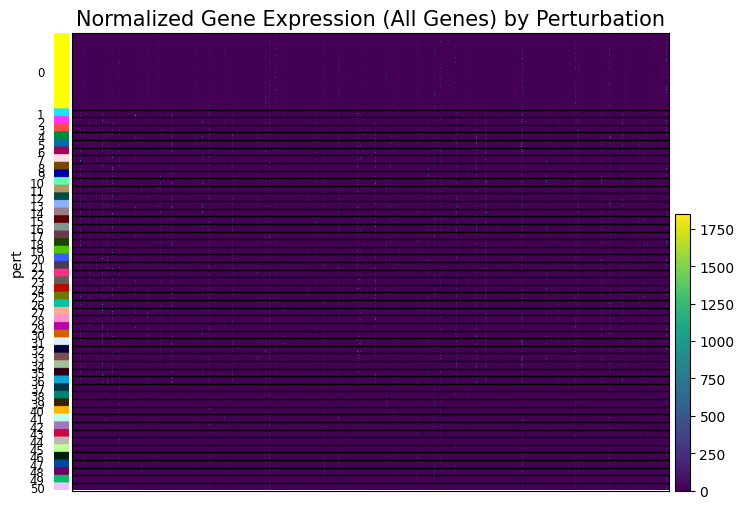

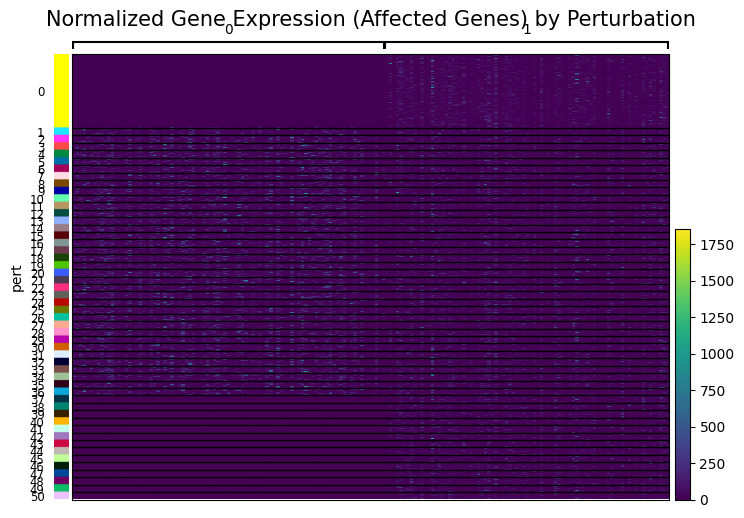

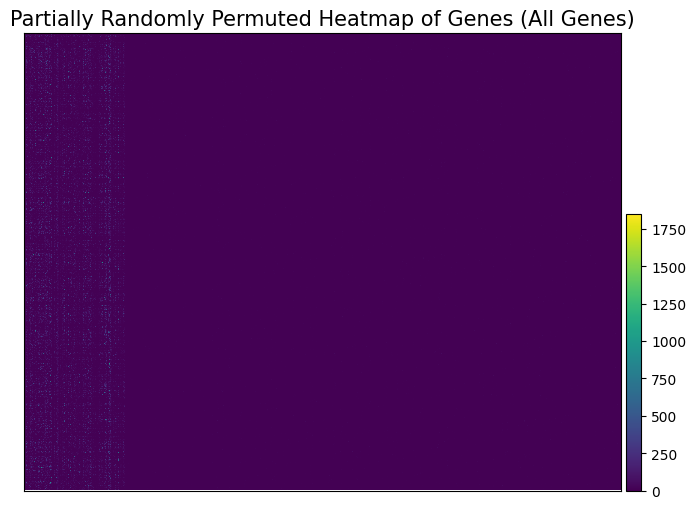

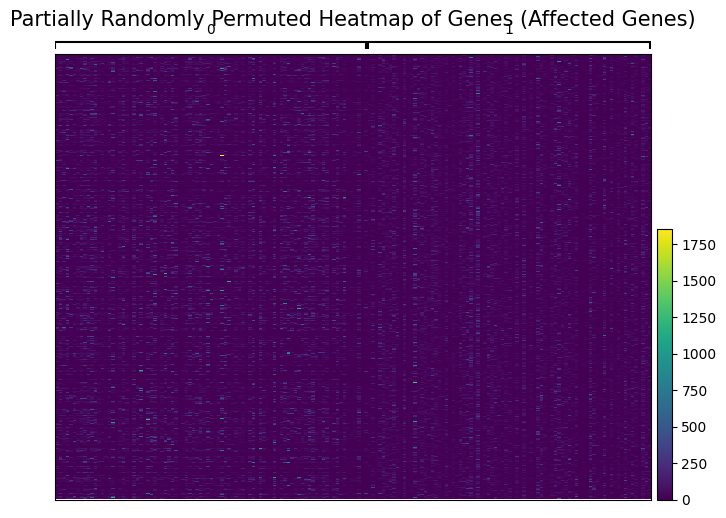

/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/scanpy/plotting/_tools

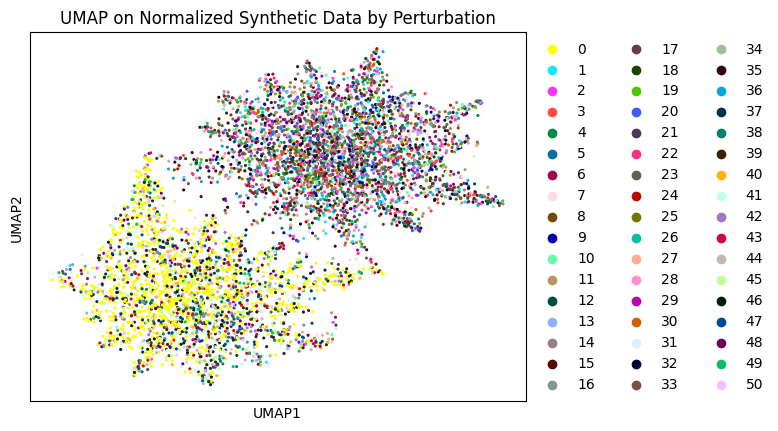

simulated_data_cc_20


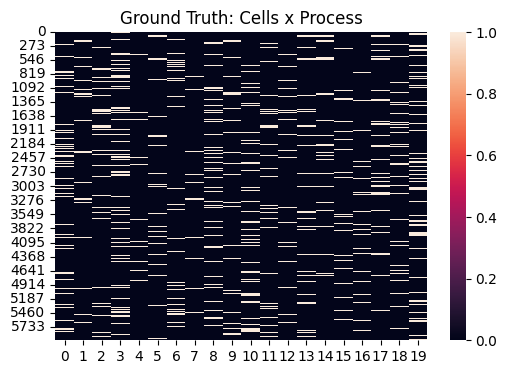

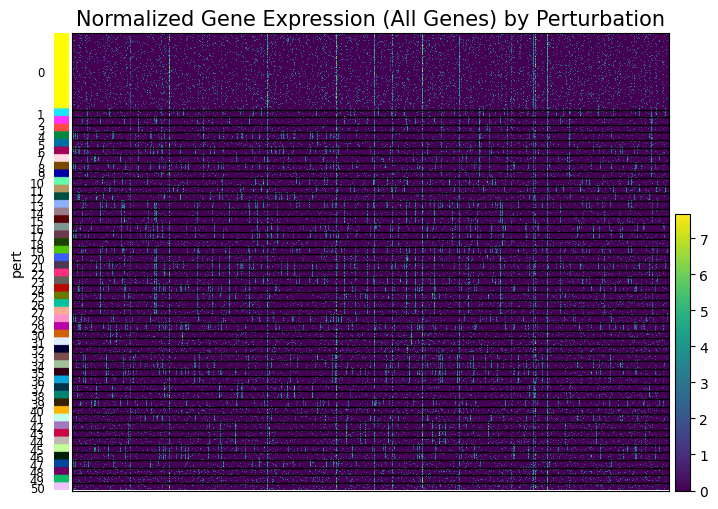

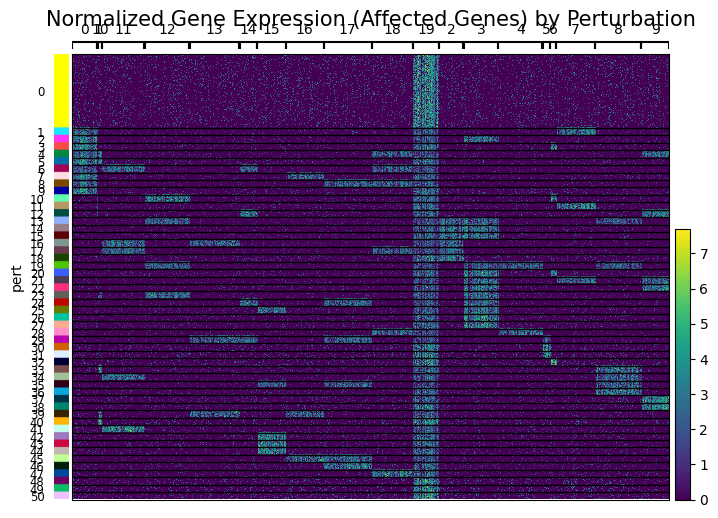

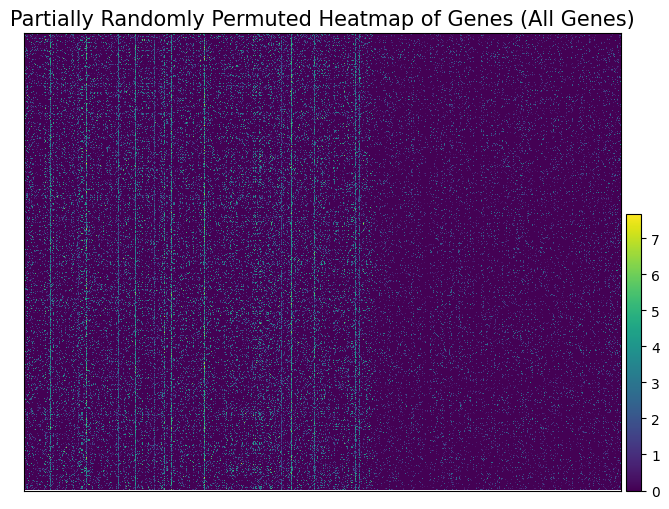

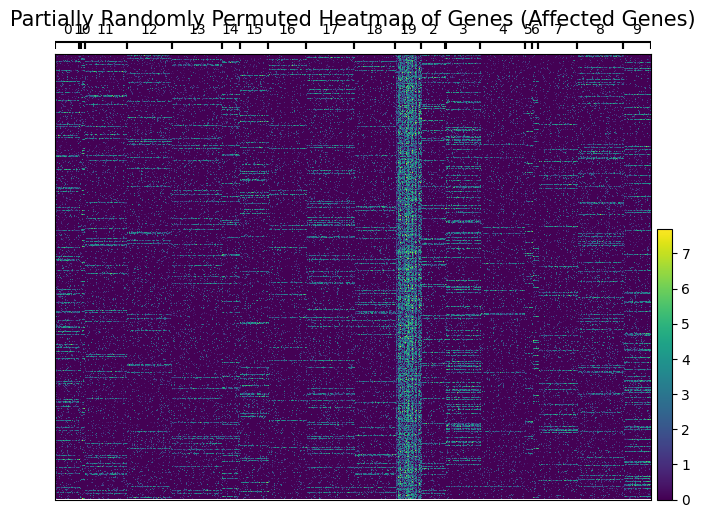

/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1216: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/Users/jeromecho/Library/Caches/pypoetry/virtualenvs/drvi-notebooks-jvzV9VJQ-py3.10/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


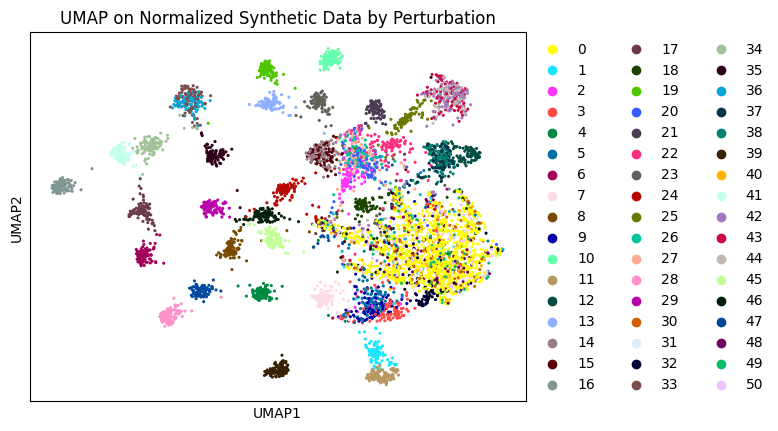

In [29]:
# Overlapping processes dataset

for data_name, adata in simulated_datasets.items():
    print(data_name)
    
    affected_genes = adata.uns["affected_genes"]

    # Plot # 1 : What cells are affected by what processes? 
    plt.figure(figsize=(6, 4))
    sns.heatmap(adata.obsm['ground_truth_identity'])
    plt.title("Ground Truth: Cells x Process")
    plt.show()

    # Plot # 2 - Group (normalized) gene expression profiles by perturbation 
    heatmap = sc.pl.heatmap(adata, adata.var.index, groupby="pert", show=False) 
    heatmap['heatmap_ax'].set_title("Normalized Gene Expression (All Genes) by Perturbation", fontsize=15)
    # plt.savefig(save_path / f"{data_name}_ordered_all_genes.pdf", bbox_inches='tight')
    plt.show()

    # Plot # 3. - Group (normalized) gene expression profiles for only the affected/marker genes of each process
    heatmap = sc.pl.heatmap(adata, affected_genes, groupby="pert", show=False)
    heatmap['heatmap_ax'].set_title("Normalized Gene Expression (Affected Genes) by Perturbation", fontsize=15, pad=20)
    # plt.savefig(save_path / f"{data_name}_ordered_aggected_genes.pdf", bbox_inches='tight')
    plt.show()
    
    var_shuffled = adata.var.iloc[list(np.random.permutation(np.argwhere(adata.varm['ground_truth_effect'].sum(axis=1) > 0).flatten())) + list(np.random.permutation(np.argwhere(adata.varm['ground_truth_effect'].sum(axis=1) == 0).flatten()))].index
    adata_shuffled = adata[np.random.permutation(adata.obs.index), var_shuffled].copy()
    adata_shuffled.obs['dummy'] = 'dummy'

    # Plot # 4 - Plot partially random heatmap of genes (plot the columns of genes affected by any process first, then those genes unaffected by any process). 
    #            Do not group the cells according to a meaningful grouping category 
    heatmap = sc.pl.heatmap(adata_shuffled, adata_shuffled.var.index, groupby="dummy", show=False)
    heatmap['heatmap_ax'].set_title("Partially Randomly Permuted Heatmap of Genes (All Genes)", fontsize=15)
    # plt.savefig(save_path / f"{data_name}_shuffled_all_genes.pdf", bbox_inches='tight')
    plt.show()

    # Plot # 5 - Same plotting logic as #4, but only pay attention to marker genes 
    heatmap = sc.pl.heatmap(adata_shuffled, affected_genes, groupby="dummy", show=False)
    heatmap['heatmap_ax'].set_title("Partially Randomly Permuted Heatmap of Genes (Affected Genes)", fontsize=15, pad = 20)
    # plt.savefig(save_path / f"{data_name}_shuffled_aggected_genes.pdf", bbox_inches='tight')
    plt.show()

    # Plot #6 - UMAP of synthetic data based on the perturbation 
    # TODO - remove if you don't want to run UMAP on the raw counts
    adata.X = adata.layers['counts'] 
    
    sc.tl.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata, spread=1.0, min_dist=0.5, random_state=123)
    sc.pl.umap(adata, color=['pert'], show=False)
    plt.title("UMAP on Normalized Synthetic Data by Perturbation")
    # plt.savefig(save_path / f"{data_name}_umap.pdf", bbox_inches='tight')
    plt.show()
    
    adata_write = adata[np.random.permutation(adata.obs.index), np.random.permutation(adata.var.index)].copy()
    
    # adata_write.write_h5ad(save_path / f"{data_name}.h5ad")

In [14]:
adata

AnnData object with n_obs × n_vars = 6000 × 1000
    obs: 'pert', 'perfect_order'
    var: 'perfect_order'
    uns: 'affected_genes', 'log1p', 'pert_colors', 'pca', 'neighbors', 'umap'
    obsm: 'ground_truth_identity', 'ground_truth_z', 'X_pca', 'X_umap'
    varm: 'ground_truth_effect', 'PCs'
    layers: 'counts'
    obsp: 'distances', 'connectivities'

# Collect wandb information for runs

users aiming at jusy making data should skip this part.

In [15]:
simulated_datasets.keys()

dict_keys(['synthetic_data_unique_no_noise', 'synthetic_data_unique', 'synthetic_data_overlapping_4_no_noise', 'synthetic_data_overlapping_4'])

In [16]:
import pandas as pd 
import wandb

api = wandb.Api()
api.flush()
data_name = "synthetic_data_overlapping_4"

/Users/jeromecho/Library/CloudStorage/OneDrive-Personal/Thesis/code/venvs/DRVI_REPRO/lib/python3.10/site-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/Users/jeromecho/Library/CloudStorage/OneDrive-Personal/Thesis/code/venvs/DRVI_REPRO/lib/python3.10/site-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only 

In [17]:
# Project is specified by <entity/project-name>
runs = api.runs("moinfar_proj/simulatedDRVI_runs_drvi_4.7")

result_list = []
for run in runs: 
    result_list.append({
        'name': run.name,
        'summary': run.summary._json_dict,
        'config': {k: v for k,v in run.config.items() if not k.startswith('_')},
    })
            
runs_df = pd.json_normalize(result_list, sep='_')
runs_df = runs_df.query(f'config_params_input_adata.str.contains("{data_name}.h5ad")')
runs_df = runs_df.query('(summary_epoch == config_params_max_epochs - 1)')

runs_df['title'] = (runs_df['config_params_model'].astype(str) + '-' + runs_df['config_params_n_split_latent'].astype(str) + '-' + runs_df['config_params_split_aggregation'].astype(str)).map({
    'drvi-32-logsumexp': 'DRVI',
    'drvi-32-sum': 'DRVI-IK',
    'drvi-1-sum': 'DRVI-CVAE',
    'scvi-1-sum': 'scVI',
    'scvi-ica-1-sum': 'scVI-ICA',
    'scvi-pca-1-sum': 'scVI-PCA',
})
for k, v in zip(runs_df['title'].values, runs_df['name']):
    print(f"\t\t'{k}': logs_dir / 'models' / '{v}',")

ValueError: Could not find project simulatedDRVI_runs_drvi_4.7

In [ ]:
# Project is specified by <entity/project-name>
runs = api.runs(f"moinfar_proj/DRVI_runs_{data_name}_baselines_linear_1.0")

result_list = []
for run in runs: 
    result_list.append({
        'name': run.name,
        'summary': run.summary._json_dict,
        'config': {k: v for k,v in run.config.items() if not k.startswith('_')},
    })
            
runs_df = pd.json_normalize(result_list, sep='_')
runs_df = runs_df.query(f'config_params_input_adata.str.contains("{data_name}.h5ad")')

runs_df['title'] = runs_df['config_params_model'].map({
    'liger': 'LIGER',
    'ica': 'ICA',
    'pca': 'PCA',
    'scetm': 'scETM',
    'mofa': 'MOFA',
})
for k, v in zip(runs_df['title'].values, runs_df['name']):
    print(f"\t\t'{k}': logs_dir / 'models' / '{v}',")